This version of the snake game allows you to implement and run your evolutionary algorithm

In [1]:
import random
import time
import turtle
import numpy as np
import math

from deap import base
from deap import creator
from deap import tools
import collections
from deap import algorithms

In [2]:
XSIZE = YSIZE = 16 # Number of grid cells in each direction (do not change this)

Change headless to True when evolving your solution. You can then pickle your final solution, and run it with this set to True to visualize the result, if you wish. Note that, when using Turtle,  to run it again properly you might need to go to restart your kernel after the visualization has finished.

If you are running on the cloud, or on Google Colab, you can chose to remove the turtle and display code altogether and only run headless. You could then pickle your best solution and use this code to see it play.

In [3]:
HEADLESS = True

In [4]:
class MLP():
    def __init__(self, numInput, numHidden1, numHidden2, numOutput):
        self.fitness = 0
        self.numInput = numInput
        self.numHidden1 = numHidden1
        self.numHidden2 = numHidden2
        self.numOutput = numOutput

        self.w_i_h1 = np.random.randn(self.numHidden1, self.numInput)
        self.w_h1_h2 = np.random.randn(self.numHidden2, self.numHidden1)
        self.w_h2_o = np.random.randn(self.numOutput, self.numHidden2)

        self.b_i_h1 = [0] * numHidden1
        self.b_i_h2 = [0] * numHidden2
        self.b_i_output = [0] * numOutput
        self.ReLU = lambda x: max(0, x)

    def sigmoid(self, x):
        try:
            ans = (1 / (1 + math.exp(-x)))
        except OverflowError:
            ans = float('inf')
        return ans

    def softmax(self, x):
        e_x = np.exp(x - np.max(x))
        return e_x / e_x.sum()


    def feed_forward(self, inputs):
        h1 = np.dot(self.w_i_h1, inputs)             # feed input to hidden layer 1
        h1 = [h + b for h, b in zip(h1, self.b_i_h1)]

        h1 = [self.ReLU(x) for x in h1]              # Activate hidden layer1

        h2 = np.dot(self.w_h1_h2, h1)                # feed layer 1 to hidden layer 2
        h2 = [h + b for h, b in zip(h2, self.b_i_h2)]
        h2 = [self.ReLU(x) for x in h2]              # Activate hidden layer 2

        output = np.dot(self.w_h2_o, h2)             # feed to output layer
        output = [o + b for o, b in zip(output, self.b_i_output)]
        #output = [math.tanh(x) for x in output]      # Activate output layer
        output = self.softmax(output)
        return output

    # Weights get set as:
    # Weights to layer h1, h2, o
    # Biases to layer h1, h2, o
    def set_weights_linear(self, Wgenome):
        numWeights_I_H1 = self.numHidden1 * self.numInput
        numWeights_H1_H2 = self.numHidden2 * self.numHidden1
        numWeights_H2_O = self.numOutput * self.numHidden2

        # Weights (multi-dimensional arrays)

        first_slice_end = numWeights_I_H1

        self.w_i_h1 = np.array(Wgenome[:first_slice_end])
        self.w_i_h1 = self.w_i_h1.reshape((self.numHidden1, self.numInput))

        second_slice_end = first_slice_end + numWeights_H1_H2

        self.w_h1_h2 = np.array(Wgenome[first_slice_end:second_slice_end])
        self.w_h1_h2 = self.w_h1_h2.reshape((self.numHidden2, self.numHidden1))

        third_slice_end = second_slice_end + numWeights_H2_O

        self.w_h2_o = np.array(Wgenome[second_slice_end:third_slice_end])
        self.w_h2_o = self.w_h2_o.reshape((self.numOutput, self.numHidden2))

        # Biases (flat arrays for each layer)

        fourth_slice_end = third_slice_end + self.numHidden1

        self.b_i_h1 = np.array(Wgenome[third_slice_end:fourth_slice_end])

        fith_slice_end = fourth_slice_end + self.numHidden2

        self.b_i_h2 = np.array(Wgenome[fourth_slice_end:fith_slice_end])

        self.b_i_output = np.array(Wgenome[fith_slice_end:])

In [5]:
class DisplayGame:
    def __init__(self, XSIZE, YSIZE):
        # SCREEN
        self.win = turtle.Screen()
        self.win.title("EVCO Snake game")
        self.win.bgcolor("grey")
        self.win.setup(width=(XSIZE*20)+40,height=(YSIZE*20)+40)
        #self.win.screensize((XSIZE*20)+20,(YSIZE*20)+20)
        self.win.tracer(0)

        #Snake Head
        self.head = turtle.Turtle()
        self.head.shape("square")
        self.head.color("black")

        # Snake food
        self.food = turtle.Turtle()
        self.food.shape("circle")
        self.food.color("yellow")
        self.food.penup()
        self.food.shapesize(0.55, 0.55)
        self.segments = []

    def reset(self, snake):
        self.segments = []
        self.head.penup()
        self.food.goto(-500, -500)
        self.head.goto(-500, -500)
        for i in range(len(snake)-1):
            self.add_snake_segment()
        self.update_segment_positions(snake)
       
    def update_food(self,new_food):
        self.food.goto(((new_food[1]-9)*20)+20, (((9-new_food[0])*20)-10)-20)
        
    def update_segment_positions(self, snake):
        self.head.goto(((snake[0][1]-9)*20)+20, (((9-snake[0][0])*20)-10)-20)
        for i in range(len(self.segments)):
            self.segments[i].goto(((snake[i+1][1]-9)*20)+20, (((9-snake[i+1][0])*20)-10)-20)

    def add_snake_segment(self):
        self.new_segment = turtle.Turtle()
        self.new_segment.speed(0)
        self.new_segment.shape("square")
        self.new_segment.color("green")
        self.new_segment.penup()
        self.segments.append(self.new_segment)

In [6]:
class snake:
    def __init__(self, _XSIZE, _YSIZE):
        self.XSIZE = _XSIZE
        self.YSIZE = _YSIZE
        self.final_score = 0
        self.mini_score = 9999
        self.total_score = 0.0
        self.reset()


    def reset(self):
        self.snake = [[8,10], [8,9], [8,8], [8,7], [8,6], [8,5], [8,4], [8,3], [8,2], [8,1],[8,0] ]# Initial snake co-ordinates [ypos,xpos]
        self.food = self.place_food()
        self.ahead = []
        self.snake_direction = "right"

    def place_food(self):
        self.food = [random.randint(1, (YSIZE-2)), random.randint(1, (XSIZE-2))]
        # self.food = [8,15]
        while (self.food in self.snake):
            self.food = [random.randint(1, (YSIZE-2)), random.randint(1, (XSIZE-2))]
        return( self.food )

    def update_snake_position(self):
        self.snake.insert(0, [self.snake[0][0] + (self.snake_direction == "down" and 1) + (self.snake_direction == "up" and -1), self.snake[0][1] + (self.snake_direction == "left" and -1) + (self.snake_direction == "right" and 1)])

    def food_eaten(self):
        if self.snake[0] == self.food:                                            # When snake eats the food
            return True
        else:
            last = self.snake.pop()  # [1] If it does not eat the food, it moves forward and so last tail item is removed
            return False

    def snake_turns_into_self(self):
        if self.snake[0] in self.snake[1:]:
            return True
        else:
            return False

    def snake_hit_wall(self):
        if self.snake[0][0] == 0 or self.snake[0][0] == (YSIZE-1) or self.snake[0][1] == 0 or self.snake[0][1] == (XSIZE-1):
            return True
        else:
            return False

    # Example sensing functions
    def getAheadLocation(self):
        self.ahead = [ self.snake[0][0] + (self.snake_direction == "down" and 1) + (self.snake_direction == "up" and -1), self.snake[0][1] + (self.snake_direction == "left" and -1) + (self.snake_direction == "right" and 1)]

    def sense_wall_ahead(self):
        self.getAheadLocation()
        return( self.ahead[0] == 0 or self.ahead[0] == (YSIZE-1) or self.ahead[1] == 0 or self.ahead[1] == (XSIZE-1) )

    def sense_food_ahead(self):
        self.getAheadLocation()
        return self.food == self.ahead

    def sense_tail_ahead(self):
        self.getAheadLocation()
        return self.ahead in self.snake

    def wallCollide(self,x,y):
        return( y == 0 or y == (YSIZE-1) or x == 0 or x == (XSIZE-1) )

    def foodCollide(self,x,y):
        return (x == self.food[1]) and (y == self.food[0])

    def bodyCollide(self,x,y):
        return [y,x] in self.snake


    def lookInDirection(self,x_direction,y_direction):
        dis = [0,0,0]
        pos = [self.snake[0][1],self.snake[0][0]]
        distance = 0
        foodFound = False
        bodyFound = False
        pos = [pos[0]+x_direction,pos[1]+y_direction]
        distance += 1
        while((not self.wallCollide(pos[0],pos[1]))):
            if ((not foodFound) and self.foodCollide(pos[0],pos[1])):
                foodFound = True
                dis[0] = 1
            if ((not bodyFound) and self.bodyCollide(pos[0],pos[1])):
                bodyFound = True
                dis[1] = 1
            pos = [pos[0]+x_direction,pos[1]+y_direction]
            distance += 1
        dis[2] = 1/distance
        return dis


    # 调用MLP决定方向
    def snakeAI(self, AIbrain):

        #计算各个方向距离food,wall,snake_self距离

        tmp_left = self.lookInDirection(-1,0)
        tmp_left_up = self.lookInDirection(-1,-1)
        tmp_up = self.lookInDirection(0,-1)
        tmp_right_up = self.lookInDirection(1,-1)
        tmp_right = self.lookInDirection(1,0)
        tmp_right_down = self.lookInDirection(1,1)
        tmp_down = self.lookInDirection(0,1)
        tmp_left_down = self.lookInDirection(-1,1)
        input_nn = tmp_left + tmp_left_up + tmp_up + tmp_right_up + tmp_right + tmp_right_down + tmp_down + tmp_left_down
        #蛇长
        # length = len(self.snake)
        #outcome = AIbrain.feed_forward([dist_left_food, dist_up_food, dist_right_food, dist_down_food, open_spaces_left, open_spaces_up, open_spaces_right, open_spaces_down,length])
        outcome = AIbrain.feed_forward(input_nn)

        #outcome = AIbrain.feed_forward([dist_left_food, dist_up_food, dist_right_food, dist_down_food, distToWall1, distToWall2, distToWall3, distToWall4,length])

        decision = np.argmax(outcome, axis=0)

        if decision == 0:
            self.snake_direction = 'down'

        elif decision == 1:
            self.snake_direction = 'up'

        elif decision == 2:
            self.snake_direction = 'left'

        elif decision == 3:
            self.snake_direction = 'right'
        # if self.sense_wall_ahead() or self.sense_tail_ahead():
        #         hit_self = int(self.sense_wall_ahead())
        #         hit_eall = int(self.sense_tail_ahead())
        #         outcome = AIbrain.feed_forward([dist_left_food, dist_up_food, dist_right_food, dist_down_food, distToWall1, distToWall2, distToWall3, distToWall4,length,hit_self,hit_wall])

        #         decision = np.argmax(outcome, axis=0)

        #         if decision == 0:
        #             self.snake_direction = 'down'

        #         elif decision == 1:
        #             self.snake_direction = 'up'

        #         elif decision == 2:
        #             self.snake_direction = 'left'

        #         elif decision == 3:
        #             self.snake_direction = 'right'

        return self.snake_direction

In [7]:
snake_game = snake(XSIZE,YSIZE)

In [8]:
if not HEADLESS:
    display = DisplayGame(XSIZE,YSIZE)

In [9]:
def run_game(display,snake_game, headless,AIbrain):
    score = 0
    snake_game.reset()
    if not headless:
        display.reset(snake_game.snake)
        display.win.update()
    snake_game.place_food()
    game_over = False
    #snake_direction = 1

    flag = True
    live_time = 0
    frame = 0
    while not game_over:
        # ****YOUR AI BELOW HERE******************
        if (live_time == 50 and score < 6) or live_time == 250:
            break
       
        # Here is an example sensing function
        live_time += 1
        frame += 1
        snake_game.snake_direction = snake_game.snakeAI(AIbrain)
        
        

        # ****YOUR AI ABOVE HERE******************

        snake_game.update_snake_position()

        # Check if food is eaten
        if snake_game.food_eaten():
            snake_game.place_food()
            score += 1
            live_time = 0
            if not headless:
                display.add_snake_segment()

        # Game over if the snake runs over itself
        if snake_game.snake_turns_into_self():
            game_over = True
            #print("Snake turned into itself!")
            if score > 1:
                print("\nSnake turned into itself! FINAL score - " + str(score))

        # Game over if the snake goes through a wall
        if snake_game.snake_hit_wall():
            game_over = True
            #print("Snake hit a wall!")
            if score > 1:
                print("\nSnake hit a wall! FINAL score - " + str(score))

        if not headless:
            display.update_food(snake_game.food)
            display.update_segment_positions(snake_game.snake)
            display.win.update()
            time.sleep(0.2) # Change this to modify the speed the game runs at when displayed.
    '''
    if score>=3:
        print("\nFINAL score - " + str(score))
    '''
    #print()
    if not headless: turtle.done()
    if live_time >= 50:
        live_time = frame - live_time
        if live_time <= 0:
            live_time = 1
    return ((score * 2) ** 2) * (live_time ** 1.5),score

Below is what you would use for your evaluation. You would also use it to display your final (pickled and loaded) solution, with headless = False.

If you have run without headless (i.e. with the display) you will need to reset your kernel to run again. This appears to be an IPython issue with Turtle, but if you have a way to deal with that, do please let me know. You will probable only want to run it one-at-a-time anyway.

In [10]:
num_input_nodes = 24
num_hidden_nodes_1 = 32
num_hidden_nodes_2 = 12
num_output_nodes = 4

IND_SIZE = (num_input_nodes * num_hidden_nodes_1) + (num_hidden_nodes_1 * num_hidden_nodes_2) + (num_hidden_nodes_2 * num_output_nodes) + num_hidden_nodes_1 + num_hidden_nodes_2 + num_output_nodes

myNet = MLP(num_input_nodes, num_hidden_nodes_1, num_hidden_nodes_2, num_output_nodes)


In [11]:
creator.create("FitnessMax", base.Fitness, weights=(1.0,))
creator.create("Individual", list, fitness=creator.FitnessMax)

toolbox = base.Toolbox()
toolbox.register("attr_float", random.uniform, -1.0, 1.0)
toolbox.register("individual", tools.initRepeat, creator.Individual, toolbox.attr_float, n=IND_SIZE)

In [12]:
def evaluate(indiv, snake_game, myNet):
    myNet.set_weights_linear(indiv)
    snake_game.reset()
    fitness,final_score = run_game(display,snake_game,headless=True,AIbrain=myNet)
    if final_score > snake_game.final_score:
        snake_game.final_score = final_score
    if final_score < snake_game.mini_score:
        snake_game.mini_score = final_score
    snake_game.total_score += final_score
    return fitness,

In [13]:
toolbox.register("evaluate", evaluate)
toolbox.register("select", tools.selTournament, tournsize=3)
toolbox.register("mate",tools.cxOnePoint)
#toolbox.register("mate",tools.cxTwoPoint)
toolbox.register("mutate", tools.mutGaussian, mu=0.0, sigma=0.5, indpb=0.1)
toolbox.register("population", tools.initRepeat, list, toolbox.individual)
stats = tools.Statistics(key=lambda ind: ind.fitness.values)
stats.register("avg", np.mean)
stats.register("std", np.std)
stats.register("min", np.min)
stats.register("max", np.max)

In [14]:
logbook = tools.Logbook()
pop = toolbox.population(n=2000)

In [15]:
# run_game(display, snake_game, headless=HEADLESS, AIbrain = myNet)

In [16]:
HALL_OF_FAME_SIZE = 30
halloffame = tools.HallOfFame(HALL_OF_FAME_SIZE)

#记录每代最佳、最小值、均值
max_each_e = []
mini_each_e = []
avg_each_e = []

In [17]:
invalid_ind = [ind for ind in pop if not ind.fitness.valid]
fitnesses = [toolbox.evaluate(indiv, snake_game, myNet) for indiv in invalid_ind]
max_e = snake_game.final_score
max_each_e.append(max_e)
min_e = snake_game.mini_score
mini_each_e.append(min_e)
avg_e = snake_game.total_score/len(invalid_ind)
avg_each_e.append(avg_e)

In [18]:
for ind, fit in zip(pop, fitnesses):
    ind.fitness.values = fit
halloffame.update(pop)
hof_size = len(halloffame.items) if halloffame.items else 0

In [19]:
record = stats.compile(pop) if stats else {}
logbook.record(gen=0,nevals=len(invalid_ind),**record)

In [20]:
NGEN = 500
for g in range(NGEN):
    print("-- Generation %i --" % g)
    snake_game.final_score = 0
    snake_game.mini_score = 0
    snake_game.total_score = 0.0
    selected = toolbox.select(pop, len(pop) - hof_size)
    offspring = list(map(toolbox.clone, selected))
    offspring = algorithms.varAnd(offspring,toolbox,0.9,0.1)
    invalid_ind = [ind for ind in offspring if not ind.fitness.valid]
    fitnesses = [toolbox.evaluate(indiv, snake_game, myNet) for indiv in invalid_ind]
    max_e = snake_game.final_score
    min_e = snake_game.mini_score
    mini_each_e.append(min_e)
    avg_e = snake_game.total_score/len(invalid_ind)
    avg_each_e.append(avg_e)
    max_each_e.append(max_e)
    for ind, fit in zip(invalid_ind, fitnesses):
        ind.fitness.values = fit
    offspring.extend(halloffame.items)
    halloffame.update(offspring)
    pop[:] = offspring
    record = stats.compile(pop)
    logbook.record(gen=g,nevals=len(invalid_ind), **record)
    print(logbook.stream)

-- Generation 0 --

Snake turned into itself! FINAL score - 2
avg     	gen	max    	min	nevals	std    
0.688741	0  	126.491	0  	2000  	6.56701
2.05019 	0  	331.276	0  	1792  	13.26  
-- Generation 1 --

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2
3.07321 	1  	331.276	0  	1808  	16.8638
-- Generation 2 --

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2
3.55321 	2  	331.276	0  	1837  	19.2883
-- Generation 3 --

Snake hit a wall! FINAL score - 2
3.608   	3  	362.039	0  	1814  	21.1803
-- Generation 4 --

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2
3.91117 	4  	362.039	0  	1808  	21.9758
-- Generation 5 --

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2
4.38948 	5  	362.039	0  	1766  	23.6955
-- Generation 6 --

Snake hit a wall! FINAL 

14.7434 	47 	1325.11	0  	1769  	87.3475
-- Generation 48 --

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2
14.8095 	48 	1325.11	0  	1820  	87.2762
-- Generation 49 --

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2
15.01   	49 	1325.11	0  	1793  	85.5338
-- Generation 50 --

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2
16.4056 	50 	1325.11	0  	1777  	92.1059
-- Generation 51 --

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2
14.2403 	51 	1325.11	0  	1798  	89.4349
-- Generation 52 --

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2
14.042  	52 	1325.11	0  	1807  	83.1114
-- Generation 53 --

Snake hit a 


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2
36.8061 	73 	2981.49	0  	1772  	190.756
-- Generation 74 --

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2
4


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL s


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINA


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2
111.647 	90 	4500   	0  	1749  	412.92 
-- Generation 91 --

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wa


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned i


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wa


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake 

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! 


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake 


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2
202.8   	118	15587.5	0  	1802  	938.111
-- Generation 119 --

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL sc


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake 

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2
262.563 	127	19743.1	0  	1794  	1205.26
-- Generation 128 --

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake 


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wa


Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL s


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FI


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2
1672.24 	139	


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake 


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake 


Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall!


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

S


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3
1787.5  	148	1.28765e+06	0  	1783  	40801.1
-- Generation 149 --

Snake hit a wa


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2
17


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2
1233.1  	153	1.28765e+06	0  	1802  	28947.4
-- Generation 154 --

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itse


Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL scor


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2
1451.51 	156	1.28765e+06	0  	1797  	29125.1
-- Generation 157 --

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wa


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL s


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2
1992.61 	160	1.28765e+06	0  	1780  	31127.9
-- Generation 161 --

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into it


Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into i


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2



Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL scor

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned in


Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2
6297.83 	168	1.34848e+06	0  	1802  	63828.5
-- Generation 169 --

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL s


Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snak


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itsel


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score -


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Sna


Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score -

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned


Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itsel


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a 

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itse


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! F


Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake t


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FI


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snak


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL sco

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2




Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL 


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2
27676.1 	180	6.0453e+06 	0  	1809  	213727 
-- Generation 181 --

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2



Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itse


Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wal


Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score -

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake t


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake 


Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake t

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL sc


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Sn


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itsel


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake


Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL 


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score -

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake hi


Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake h


Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL sco


Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snak


Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINA


Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

S


Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itse

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake t

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned 

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake tu

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself


Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into it

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itsel

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned int

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned 

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake t

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned int


Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turne

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned 

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned in

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake 

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into it

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itsel

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snak

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake tu

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL sc


Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake 


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into i

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself!

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake h


Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Sn

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake tu

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wal

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itsel

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake turned int


Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake t


Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned in

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2
148166  	206	8.74193e+06	0  	1778  	806256 
-- Generation 207 --

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 26

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake t

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! F

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned in

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake 


Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turne


Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3
147478  	208	8.74193e+06	0  	1774  	831479 
-- Generation 209 --

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake tu

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned in

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6



Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake tu


Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake 


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itsel

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned in

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 6
161697  	213	2.57454e+07	0  	1790  	1.14061e+06
-- Generation 214 --

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FI


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake tur


Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score 

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snak

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL 

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINA


Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake t

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into it

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wa

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6
247900  	217	2.57454e+07	0  	1802  	1.62928e+06
-- Generation 218 --

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake tur


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake turned into its


Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake turned in

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a w

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINA


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

S

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned i


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake tur


Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wal


Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL scor

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Sna

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a w

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 16

Snake hit a wall! FI

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake tu

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned 

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! 

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snak

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score -

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL sc


Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 25

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL scor

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned i


Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score -


Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itsel


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake 


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 25

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned 

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL 


Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FI


Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score


Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wal


Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself!


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turne


Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL scor

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 25

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a w


Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 8

Snake turned into itse


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake tu

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL scor


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into it

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 28

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned 


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 13

S


Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned i


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned i


Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 11

Snake turned i


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itsel


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score 


Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 22

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 28

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINA


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hi


Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL sco


Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake hit

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snak


Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake turned into i

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Sna


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake 


Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into i


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake hit a wall! 

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turn


Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2




Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL s


Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 30

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 28

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! F

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4
552556  	240	5.00058e+07	0  	1773  	3.2125e+06 
-- Generation 241 --

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 18

S

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL sco


Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned in

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! 

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL 


Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake turne


Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2



Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snak


Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINA


Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall!


Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake hit a wall!

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snak


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! F


Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake tu

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2
625856  	245	5.00058e+07	0  	1801  	3.54431e+06
-- Generation 246 --

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itse


Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FIN


Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 18

Snake turned i

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FI


Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 21

Snake

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2


Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 22

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 24

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 10

Sn


Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 26

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FI


Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake turned into itself


Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL s

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turn


Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 23

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 26

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 13

Snak


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a


Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 22

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL 


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 22

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4
863274  	250	5.00058e+07	0  	1782  	3.93637e+06
-- Generation 251 --



Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 26

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hi


Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 12
994390  	251	5.00058e+07	0  	1790  	4.41057e+06
-- Generation 252 --

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL sc

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 9

Snake turn


Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 8

Snake turned i


Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score -


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score -

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 4

Snake hit a w


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snak


Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned 


Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned


Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL sc


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FI

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FI


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2




Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 25

Snake turned into itself! FINAL score - 23

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Sn


Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake turn


Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score 


Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 24

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 


Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 27

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 34

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score -

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6


Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 6
1.74934e+06	258	6.27447e+07	0  	1771  	6.17034e+06
-- Generation 259 --

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 20

Snake 


Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL sc

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 24

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 7

Sn


Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5
1.7038e+06 	259	6.27447e+07	0  	1809  	6.21655e+06
-- Generation 260 --

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL scor


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake turned into itself! 


Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 16




Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 31

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FI


Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snak

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall!


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a w

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 24

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake turne


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 19

Snake turned int


Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake


Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 16

Snake h


Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 23

Snake hit


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake turned i


Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 26

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL 


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned int


Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 3



Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 27

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake turned into it


Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 25

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL 


Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 


Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Sn


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL sc

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 


Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score -


Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 13

Snake turned into it


Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itse


Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 24

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 1


Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

S


Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Sna


Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score 


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 6

Snake turned into itself


Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake turned into itself!


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9
3.43709e+06	270	7.66902e+07	0  	1789  	8.84311e+06
-- Generation 271 --

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL sc


Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake h


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score 


Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 31

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into its


Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11


Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Sn


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hi


Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 18

Snake hit 


Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake


Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 29


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 23

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 


Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score -


Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINA


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake turned into itself! F


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake turned


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18




Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit


Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score -


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 10

Snake turned into it


Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a 


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 22

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL


Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake hi


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! 


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2


Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 7

Snake hit a w


Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL sco


Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 27

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into i


Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 23

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake turne


Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Sna


Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL scor


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wal


Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake 


Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 26

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake turned 


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3



Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FI


Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL scor


Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 16



Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL s


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 22

Snake turne


Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FI


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake tu


Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snak


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score 


Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL sc


Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL sc


Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! 


Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake turned i


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into it


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake hit a


Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL sc


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score


Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 23

Snake hi


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 24

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turne


Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 7




Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL 


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wal


Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 8

Snake hit a


Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8




Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score


Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itse


Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 15

Snake turned into i


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall


Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hi


Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score -


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 24

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 8

Snake turned i


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a 


Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! F


Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 25

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 


Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snak


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 12

Sna


Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

S


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL sco


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score -


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score -


Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 2

Sna


Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 3

Snake hit a w


Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

S


Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 13




Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a 


Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 27

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2




Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 22

Snake turne


Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 22

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake h


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score -


Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 20

Snake hit 


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 2

Sna


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL


Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score -


Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score -


Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 25

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score -


Snake turned into itself! FINAL score - 29

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 35

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Sn


Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score -


Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake 


Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 16

Snake hit


Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into its


Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 24

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Sn


Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score -


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake h


Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 22

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 7



Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 2

Sna


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall!


Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 12

Snake turned into itself! 


Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL


Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 17




Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 9
5.58662e+06	308	8.01965e+07	0  	1801  	1.08617e+07
-- Generation 309 --

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15




Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a 


Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score


Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13
5.66342e+06	309	8.01965e+07	0  	1795  	1.10496e+07
-- Generation 310 --

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 7



Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! F


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 23

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake h


Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 14
5.79251e+06	310	8.01965e+07	0  	1790  	1.11203e+07
-- Generation 311 --

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Sna


Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wall! 


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12
5.7513e+06 	311	8.01965e+07	0  	1804  	1.09117e+07
-- Generation 312 --

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

S


Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake 


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 8

Snake hit


Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 12
6.08262e+06	312	8.01965e+07	0  	1796  	1.12189e+07
-- Generation 313 --

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL sc


Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 9



Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 24

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 19

Snake hit a 


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 27

Snake turned into itse


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

S


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake h


Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL sco


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 18

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit 


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2
5.90711e+


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 32

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 7

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3




Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 27

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11
5.79248e+06	316	8.01965e+07	0  	1810  	1.11421e+07
-- Generation 317 --

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! 


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL scor


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake


Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 25

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score 


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Sna


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 19

Snake hit a wall! F


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL s


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7


Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score 


Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13
5.78541e+06	320	8.01965e+07	0  	1817  	1.13403e+07
-- Generation 321 --

Snake turned into itself! FINAL score - 25

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Sn


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake turned into itsel


Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 17

S


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 23

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake turned into its


Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Sn


Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 27

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 18

Snake turned into it


Snake hit a wall! FINAL score - 29

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL scor


Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 35

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13



Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 20

Sn


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7




Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 20

S


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL sc


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score 


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 27

Snake hit a wall!


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 2



Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FI


Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wa


Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score


Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake turned into i


Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake hit a wal


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FI


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! F


Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake turned 


Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake h


Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itsel


Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit 


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FI


Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a 


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snak


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 15

Snake hit 


Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hi


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 1


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score


Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into its


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 28

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 31

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 9


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake turned into i


Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 30

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 12


Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake h


Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall


Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL sc


Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 14

Snake turned into itself! FI


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 22

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL s


Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a 


Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake


Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wa


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 25

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snak


Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL scor


Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 9

Sn


Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL


Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake turn


Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2


Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 32

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 19


Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake 


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7




Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 27

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2




Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINA


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score 


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 27

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL 


Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 30

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit 


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL s


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake h


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake hi


Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wal


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score -


Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 14



Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINA


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake hi


Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 13

Snak


Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score -


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 24

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall


Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 24

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 6

Snake hit a wall! 


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake hit a 


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself!


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL scor


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 15

Snake


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL sco


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a w


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 5


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 19

Snake hit a wa


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake turned into 


Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 23

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake 


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 8

Snake hit 


Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wa


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 32

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall!


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a


Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake 


Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL sco


Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hi


Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake hi


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 9

Snake


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score -


Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! 


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL s


Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake


Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FIN


Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 33

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! 


Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wa


Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake hi


Snake turned into itself! FINAL score - 27

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 32

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL sco


Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wa


Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13


Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a


Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11
6.46991e+06	358	8.36063e+07	0  	1796  	1.16626e+07
-- Generation 359 --

Snake hit a wall! FINAL score - 4


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 17

Snake hit a wall


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake hit a wall!


Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hi


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 27

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! 


Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake tur


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 27

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 22

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL 


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 18

Snake hit a 


Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 16

Snake t


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 8

Snake hit 


Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11


Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score -


Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake h


Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall


Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wa


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 28

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 14

Snake turned into i


Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake turn


Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake t


Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 13

Snake t


Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL scor


Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake turned into itsel


Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 15

Snake hit a wall! FI


Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake h


Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 24

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINA


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit


Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 24

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit


Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL 


Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 1


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6



Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wal


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 11

Snake 


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wa


Snake turned into itself! FINAL score - 26

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 24

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 22

Sna


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL s


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Sna


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake t


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 26

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINA


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 32

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL 


Snake hit a wall! FINAL score - 30

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 18

S


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 29

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall!


Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 16

Snake hit a


Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 24

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINA


Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Sn


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! 


Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a w

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL 


Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned int

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 14

Snake hit a wa


Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score 


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6



Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake


Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! F


Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake h


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Sn


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake 


Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a 


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snak

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINA


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake turned i


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL s


Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake turned

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake turned i


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 30

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! 

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score


Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! F


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake turned into itself! FIN


Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 28

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FI

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 9

Snake turne


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FIN

Snake turned into itself! FINAL score - 27

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15
6.9414e+06 	384	8.36063e+07	0  	1792  	1.25103e+07
-- Generation 385 --

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wal


Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a


Snake turned into itself! FINAL score - 28

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL scor

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL scor


Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score 


Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 18

Snake hit a wall!


Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a 

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2


Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake turned into itself! FI


Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15



Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 30

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! F


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 6


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 27

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2


Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! F


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 31

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 5



Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 22

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 3

S


Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINA


Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 27


Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake turned into


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 


Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itsel


Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL


Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 16

Snake hi


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! F


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wal


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score -


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake hit


Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score 


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 22

Snake hi


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score 


Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 31

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake tu


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 2



Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL sc


Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 3

Sn


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 24

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 


Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 3

Snake turned into itself!


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake turned int


Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 32

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 3

Snake hit a wall! F


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL sc


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19


Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

S


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL scor


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 23

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 4

Snake turned into itself! FIN


Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hi


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 30

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 5

Snake hit a w


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 24

Snake turned into itself! FINAL score - 32

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

S


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned 


Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL sco


Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 23

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 27

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17




Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL 


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6
6.99195e+06	402	8.36063e+07	0  	1817  	1.29872e+07
-- Generation 403 --

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 14




Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL sc


Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake turned into itself! FI


Snake hit a wall! FINAL score - 12
7.49182e+06	403	8.36063e+07	0  	1754  	1.32461e+07
-- Generation 404 --

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL sc


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score 


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! 


Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 14

Snake


Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Sna


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake t


Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 22

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 6

Sn


Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 31

Snake


Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 6
6.61792e+06	406	8.78173e+07	0  	1792  	1.25047e+07
-- Generation 407 --

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL sc


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL 


Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2




Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL 


Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score 


Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake hit 


Snake hit a wall! FINAL score - 28

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 20

Snake hit a 


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Sna


Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake turned into itself! F


Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 18

Snake 


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2



Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake turn


Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a 


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 30

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake hit a wall! 


Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 10

Sn


Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL scor


Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 22

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Sn


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 29

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake 


Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 17

Snake hit


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! F


Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! 


Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 30

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall!


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 28

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 8

Snake turned i


Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wal


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 22

Sna


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL sco


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 26

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 7

Snake hit 


Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL sco


Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 29

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a


Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake


Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 28

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL sco


Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall


Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score 


Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4


Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL s


Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake 


Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 7

Snake hit a 

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Sn


Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score -

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

S


Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 26

Snake turned into itself! FINAL score - 27

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a w


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 31

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake turned

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 7
7.27382e+06	423	9.5715e+07 	0  	1796  	1.33764e+07
-- Generation 424 --

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 23

Snake h


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 18

S


Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 25

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score -


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 33

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15
6.92875e+06	424	9.5715e+07 	0  	1807  	1.29396e+07
-- Generation 425 --

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake hit a 


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a w


Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 28

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 28

Snake turned into 

7.46419e+06	425	9.5715e+07 	0  	1799  	1.39024e+07
-- Generation 426 --

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake hit a wall! 


Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score -


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL s


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 1


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wa


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake 


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2
7.19434e+06	427	9.5715e+07 	0  	1816  	1.30988e+07
-- Generation 428 --

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake hit a wall


Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake hit a wal


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake h


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 23

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 25
7.39642e+06	428	9.5715e+07 	0  	1792  	1.35605e+07
-- Generation 429 --

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake


Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL scor


Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 24

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4
7.2831e+06 	429	9.5715e+07 	0  	1803  	1.36712e+07
-- Generation 430 --

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit


Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL 


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2
7.31189e+06	430	9.5715e+07 	0  	1802  	1.321e+07  
-- Generation 431 --

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FIN

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 24

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL scor


Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a


Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 26

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score -


Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2


7.40017e+06	432	9.5715e+07 	0  	1807  	1.34301e+07
-- Generation 433 --

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score 


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FI


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 20

S

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 30

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 14

Snake hit a wall! 


Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5



Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 17

Snake hit a wall! F


Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 25

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 34

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 2

Sna


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 33

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 21

Snake turned into


Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 10

Snake hit a wall! F


Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FIN


Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 25

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into its


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11




Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake h


Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 32

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake turned int


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8
7.57071e+06	438	9.5715e+07 	0  	1776  	1.32036e+07
-- Generation 439 --

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake turned in


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! 


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hi


Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3




Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 27

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake turned


Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snak


Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

S


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 6

Sn


Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall!


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 27

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! 


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wa


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 4

Snake hit a wall!


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake hit a 


Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 22

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake 


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13



Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 17

Snake h


Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL sc


Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 27

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit


Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wa


Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL sc


Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINA


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 30

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL scor


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 25

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 24

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 22

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 20

Snake hit 


Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 32

Snake turned into itself! FINAL score - 15



Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

S


Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 24

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score -


Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 22

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Sna


Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 30

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 7

Sna


Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL sco


Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 25

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! 


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake turne


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3


Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 15

Snake turned into its


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 31

Snake turned into itself! FINAL score - 13

Snake turned into


Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL sco


Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! F


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score -


Snake turned into itself! FINAL score - 27

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FIN


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 25

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 


Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 30

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 27

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit 


Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake h


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 30

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9



Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake


Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 35

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13




Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 27

Snake hit a w


Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Sna


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 17

Snake hit 


Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL sc


Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 28

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 27

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL


Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2



Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! F


Snake turned into itself! FINAL score - 27

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit


Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! F


Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit 


Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 30

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself!


Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL sc


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

S


Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 7

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake t


Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 23

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score 


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 24

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake h


Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Sn


Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a 


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake turned into itsel


Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake turned 


Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a w


Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 4

Snake h

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score


Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit


Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wa


Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 28

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL s

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! F


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake h


Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINA

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 27

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FIN

Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3




Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 14

Snake turned into itself! FI


Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Sn

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL sco

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 17

Sna

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snak


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake 


Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 29

Snake hit a wall! 


Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL scor


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL 


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 30

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake turned into itself! FI


Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 


Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 7

S


Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 29

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake tu


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 22

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score -


Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL sco


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3



Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

S


Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2
7.14638e+06	474	9.5715e+07 	0  	1815  	1.30528e+07
-- Generation 475 --

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake turned into itself!

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 8

Snake turned into itse


Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 27

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 21

Snake hit a wal


Snake hit a wall! FINAL score - 7
7.54474e+06	475	9.5715e+07 	0  	1803  	1.32966e+07
-- Generation 476 --

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 15

Snake hit a 


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit 


Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9




Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL s


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score -


Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 7

Snake turn


Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake h


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4



Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12




Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3



Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 25

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL sco


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL 


Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 6
7.17664e+06	480	9.5715e+07 	0  	1784  	1.3047e+07 
-- Generation 481 --

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 2

Sna


Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 16

Snake hit 


Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 28

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 29

Snake h


Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 20
7.66963e+06	481	9.5715e+07 	0  	1788  	1.38248e+07
-- Generation 482 --

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake hit a 


Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18

Sna


Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 23




Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 24

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall!


Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 6

Snake turned into itse


Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake tu


Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wa


Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 7

S


Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 17



Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 11

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2



Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL sc


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a w


Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 1

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall


Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 25

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake hit a wall! FIN


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 30

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL sco


Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 12

Snake hit a wa


Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit 


Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 20

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 15

Snake hit 


Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 6

Snake hit a wall! FI


Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 10

Snake turned into itself! FINAL score - 21

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 17

Snake turned into itself! FINAL score - 24

Sn


Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 24

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 1


Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 27

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score 


Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 3

Snake hit 


Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 22

Snake hit a wal


Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 15

Snake hit a wall


Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 14

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 5



Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 18

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL sc


Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 18
7.82612e+06	491	9.5715e+07 	0  	1788  	1.35006e+07
-- Generation 492 --

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a 


Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 13




Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 23

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 9

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 2

Snak

7.73593e+06	492	9.5715e+07 	0  	1779  	1.35679e+07
-- Generation 493 --

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 


Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 15

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake turned into it


Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 22

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL 


Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3
7.62619e+06	493	9.5715e+07 	0  	1800  	1.3636e+07 
-- Generation 494 --

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 27

Snake turned into itself! FINAL score - 23

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 14

Snake hi


Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 11

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 29

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! 


Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 20

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake turned into itself! FINAL score - 10

Snake hi


Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 25

Snake hit a wall! FINAL score - 23

Snake 


Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 16

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 17

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 14

Snake 


Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 13

Snake turned into itself! FINAL score - 23

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 27

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 9

Snake hi


Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 19

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 15

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 10

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 22

Snake hit a wall! FINAL sco


Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 27

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL sc


Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 24

Snake hit a wall! FINAL score - 20

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 32

Snake hit a wall! FINAL score - 1


Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 12

Snake hit a 


Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 10

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 5

Snake turned into itself! FINAL score - 20

Snak


Snake turned into itself! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 23

Snake turned into itself! FINAL score - 2

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 17

Snake hit 


Snake turned into itself! FINAL score - 7

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 7

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 21

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 32

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 3

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 5

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINA


Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 20

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 26

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake turned into itself! FINAL score - 14

Snake turned into itself! FINAL score - 16

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 10

Sna


Snake turned into itself! FINAL score - 6

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 11

Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 11

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 22

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 5

Snake hit a wall! FINAL score - 17



Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 8

Snake turned into itself! FINAL score - 14

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 26

Snake hit a wall! FINAL score - 12

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 21

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 4

Snake turned into itself! FINAL score - 3

Snake turned into itself! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 17

Snake 


Snake hit a wall! FINAL score - 10

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 8

Snake turned into itself! FINAL score - 9

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 8

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 4

Snake hit a wall! FINAL score - 15

Snake turned into itself! FINAL score - 12

Snake hit a wall! FINAL score - 23

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 7

Snake hit a wall! FINAL score - 9

Snake hit a wall! FINAL score - 2

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 16

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 2


Snake turned into itself! FINAL score - 2

Snake hit a wall! FINAL score - 18

Snake hit a wall! FINAL score - 13

Snake turned into itself! FINAL score - 3

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 8

Snake hit a wall! FINAL score - 6

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 17

Snake hit a wall! FINAL score - 16

Snake turned into itself! FINAL score - 4

Snake hit a wall! FINAL score - 21

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 22

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 17

Snake turned into itself! FINAL score - 19

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 13

Snake hit a wall! FINAL score - 19

Snake turned into itself! FINAL score - 18

Snake hit a wall! FINAL score - 15

Snake hit a wall! FINAL score - 12

Snake hit a wall! FINAL score - 19

Snake hit a wall! FINAL score - 14

Snake hit a wall! FINAL score - 8

Snake hit a wall! FIN

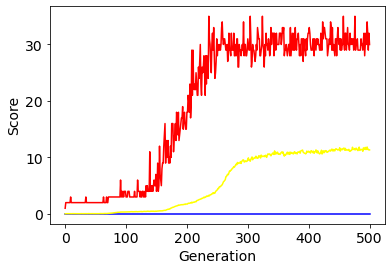

In [25]:
import matplotlib.pyplot as plt 
%matplotlib inline

plt.rc('axes', labelsize=14)
plt.rc('xtick', labelsize=14)
plt.rc('ytick', labelsize=14)
plt.rc('legend', fontsize=14)
fig, ax1 = plt.subplots()

ax1.set_xlabel("Generation")
ax1.set_ylabel("Score")


plt.plot(max_each_e,color='red')
plt.plot(mini_each_e,color='blue')
plt.plot(avg_each_e,color='yellow')

<ipython-input-29-880ad4fdac7f>:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['max', 'mini','avg'])


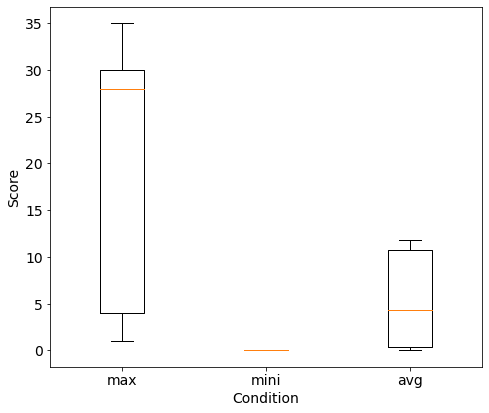

In [29]:
data_A = max_each_e
data_B = mini_each_e
data_C = avg_each_e

data = [data_A, data_B, data_C] 
fig = plt.figure(figsize =(6, 5)) 
ax = fig.add_axes([0, 0, 1, 1]) 
ax.set_xticklabels(['max', 'mini','avg']) 
ax.set_xlabel('Condition')
ax.set_ylabel('Score')
bp = ax.boxplot(data)